In [ ]:
!pip install -q shap tensorflow keras scikit-learn pandas numpy matplotlib seaborn joblib lime
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import shap
import tensorflow as tf
from tensorflow import keras
from keras.models import load_model
import pickle
import warnings
warnings.filterwarnings('ignore')
sns.set_style("whitegrid")
plt.rcParams['figure.dpi'] = 300

✓ TensorFlow version: 2.19.0
✓ SHAP version: 0.50.0
✓ All libraries loaded successfully


In [ ]:
model_path = '/content/vm_final.keras'
model = load_model(model_path)
print(f"✓ Model loaded from: {model_path}")
print(f"\nModel input shape: {model.input_shape}")
print(f"Model output shape: {model.output_shape}")

scaler_path = '/content/vm_final.pkl'
with open(scaler_path, 'rb') as f:
    scaler_data = pickle.load(f)

scalerX = scaler_data['scaler_X']
scalery = scaler_data['scaler_y']
feature_cols = scaler_data['feature_cols']
data_path = '/content/thermodynamic_data_liquid.csv'
df_full = pd.read_csv(data_path)
print(f"✓ Full dataset loaded: {df_full.shape}")

np.random.seed(42)
df = df_full.sample(n=200000, random_state=42).reset_index(drop=True)

print(f"✓ Sampled dataset for SHAP: {df.shape}")
print(f"\nFirst few rows:")
df.head()

✓ Model loaded from: /content/vm_final.keras

Model input shape: (None, 17)
Model output shape: (None, 1)

✓ Scalers loaded from: /content/vm_final.pkl
✓ Number of features: 17

Feature columns: ['T', 'P', 'MW', 'LogP', 'HBA', 'HBD', 'RotBonds', 'Rings', 'TPSA', 'NumAtoms', 'NumHeavyAtoms', 'NumHeteroatoms', 'MolWt2', 'Refractivity', 'Tc', 'Pc', 'Vc']
✓ Full dataset loaded: (934649, 20)
✓ Sampled dataset for SHAP: (200000, 20)

First few rows:


,Fluid,T,P,Vm,Tc,Pc,Vc,M,MW,LogP,HBA,HBD,RotBonds,Rings,TPSA,NumAtoms,NumHeavyAtoms,NumHeteroatoms,MolWt2,Refractivity
0,Benzene,351.629073,5.367785e+06,95.077940,562.019691,4.906289e+06,256.278002,0.078112,78.114,1.6866,0,0,0,1,0.00,6,6,0,78.046950,26.4420
1,Diethyl_Ether,275.438596,1.028423e+07,64.815960,400.378000,5.336665e+06,168.350163,0.046068,74.123,1.0428,1,0,2,0,9.23,5,5,1,74.073165,22.1670
2,Benzene,500.000000,4.364430e+06,124.975139,562.019691,4.906289e+06,256.278002,0.078112,78.114,1.6866,0,0,0,1,0.00,6,6,0,78.046950,26.4420
3,Water,261.403509,1.319396e+07,17.927637,647.096000,2.206400e+07,55.948037,0.018015,18.015,-0.8247,0,0,0,0,31.50,1,1,1,18.010565,3.6138
4,Water,302.506266,7.173826e+06,18.033745,647.096000,2.206400e+07,55.948037,0.018015,18.015,-0.8247,0,0,0,0,31.50,1,1,1,18.010565,3.6138


In [ ]:
X = df[feature_cols].values
y = df['Vm'].values
print(f"✓ Features shape: {X.shape}")
print(f"✓ Target shape: {y.shape}")
X_scaled = scalerX.transform(X)
print(f"✓ Features scaled successfully")
print(f"\nFeature statistics (after scaling):")
print(f"  Mean: {X_scaled.mean():.4f}")
print(f"  Std: {X_scaled.std():.4f}")

✓ Features shape: (200000, 17)
✓ Target shape: (200000,)
✓ Features scaled successfully

Feature statistics (after scaling):
  Mean: 0.0004
  Std: 1.0004


In [ ]:
background_size = 1000
X_background = X_scaled[:background_size]
test_size = 50000
X_test = X_scaled[background_size:background_size + test_size]
print(f"✓ Test dataset: {X_test.shape}")
explainer = shap.DeepExplainer(model, X_background)

✓ Background dataset: (1000, 17)
✓ Test dataset: (50000, 17)
Creating SHAP DeepExplainer...
This may take 1-2 minutes...
✓ SHAP DeepExplainer created successfully!


In [ ]:
from tqdm.notebook import tqdm
batch_size = 1000
n_samples = X_test.shape[0]
all_shap_values = []
for i in tqdm(range(0, n_samples, batch_size), desc="Calculating SHAP values for batches"):
    batch_X_test = X_test[i:i + batch_size]
    batch_shap_values = explainer.shap_values(batch_X_test, check_additivity=False)
    if isinstance(batch_shap_values, list):
        all_shap_values.append(batch_shap_values[0])
    else:
        all_shap_values.append(batch_shap_values)
shap_values_array = np.vstack(all_shap_values)
print("\n✓ SHAP values calculated successfully!")
print(f"Processed SHAP values shape: {shap_values_array.shape}")

Calculating SHAP values...
This may take a few minutes depending on dataset size...


Calculating SHAP values for batches:   0%|          | 0/50 [00:00<?, ?it/s]


✓ SHAP values calculated successfully!
Processed SHAP values shape: (50000, 17, 1)


<Figure size 12000x8000 with 0 Axes>

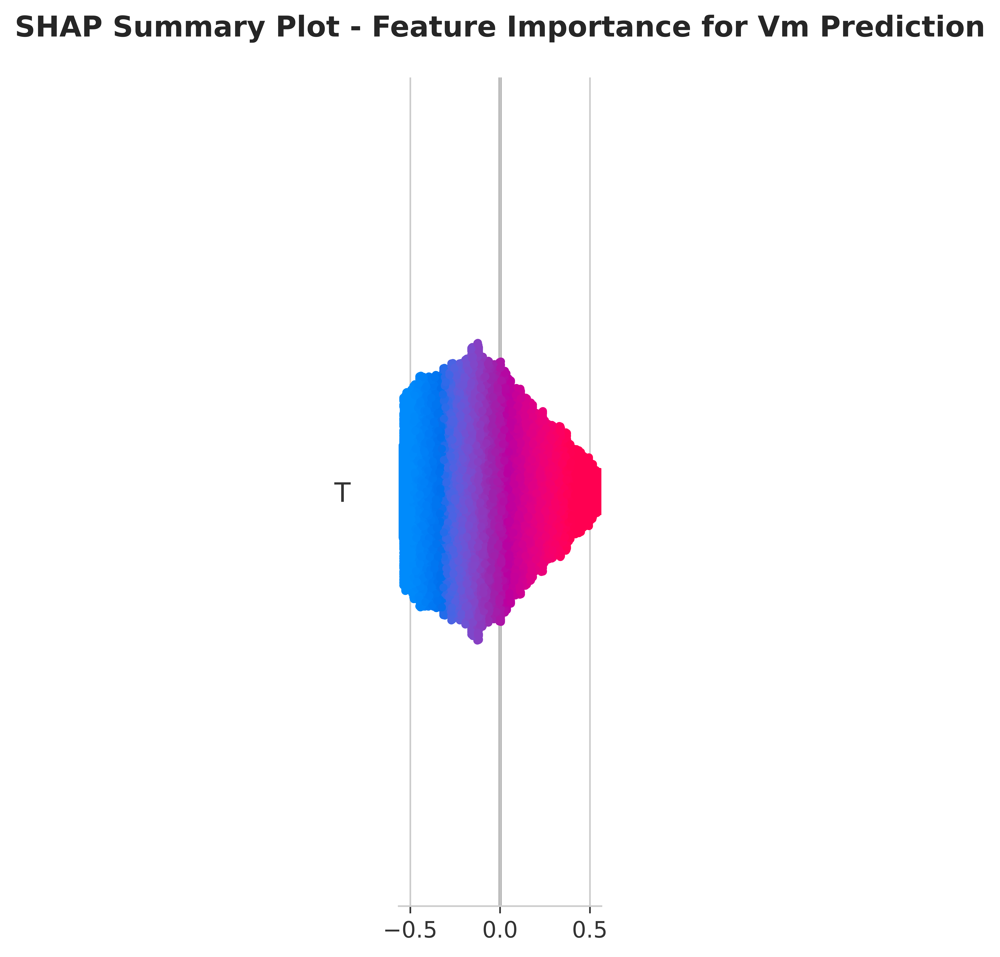

✓ Summary plot saved as 'shap_summary_plot.png'


In [ ]:
plt.figure(figsize=(12, 8))
shap.summary_plot(
    shap_values_array,
    X_test,
    feature_names=feature_cols,
    show=False
)
plt.title("SHAP Summary Plot - Feature Importance for Vm Prediction",
          fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.savefig('shap_summary_plot.png', dpi=300, bbox_inches='tight')
plt.show()
print("✓ Summary plot saved as 'shap_summary_plot.png'")

<Figure size 10000x7000 with 0 Axes>

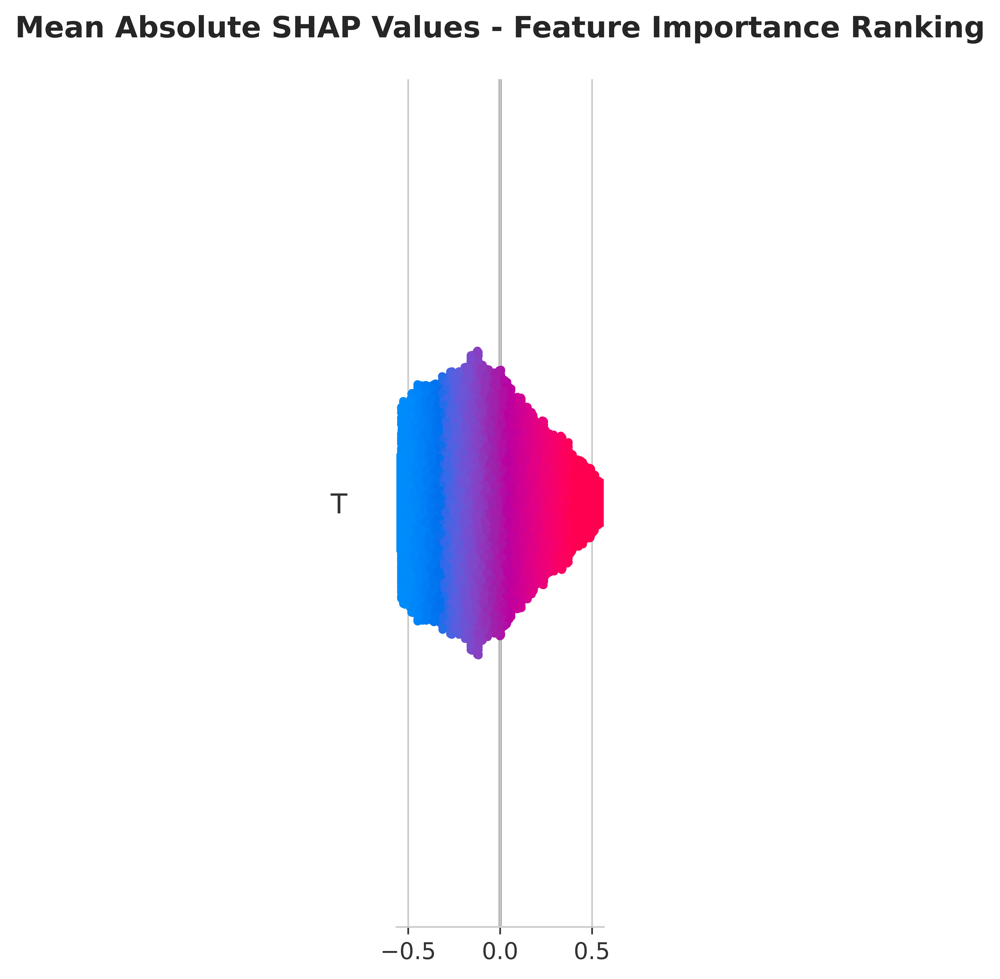

✓ Bar plot saved as 'shap_bar_plot.png'


In [ ]:
plt.figure(figsize=(10, 7))
shap.summary_plot(
    shap_values_array,
    X_test,
    feature_names=feature_cols,
    plot_type="bar",
    show=False
)
plt.title("Mean Absolute SHAP Values - Feature Importance Ranking",
          fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.savefig('shap_bar_plot.png', dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
mean_abs_shap = np.abs(shap_values_array).mean(axis=0)
feature_importance_df = pd.DataFrame({
    'Feature': feature_cols,
    'Mean_Abs_SHAP': mean_abs_shap.flatten(),
    'Importance_Rank': range(1, len(feature_cols) + 1)
}).sort_values('Mean_Abs_SHAP', ascending=False).reset_index(drop=True)
feature_importance_df['Importance_Rank'] = range(1, len(feature_cols) + 1)
print("="*60)
print("FEATURE IMPORTANCE RANKING (Based on Mean |SHAP|)")
print("="*60)
print(feature_importance_df.to_string(index=False))
print("="*60)
feature_importance_df.to_csv('feature_importance_shap.csv', index=False)
print("\n✓ Feature importance saved to 'feature_importance_shap.csv'")

FEATURE IMPORTANCE RANKING (Based on Mean |SHAP|)
       Feature  Mean_Abs_SHAP  Importance_Rank
             T       0.241671                1
            Vc       0.115007                2
         Rings       0.104047                3
  Refractivity       0.090872                4
           HBA       0.061073                5
      NumAtoms       0.056866                6
        MolWt2       0.055780                7
      RotBonds       0.053860                8
 NumHeavyAtoms       0.053682                9
            MW       0.049748               10
NumHeteroatoms       0.047347               11
            Tc       0.028602               12
            Pc       0.024121               13
          LogP       0.024029               14
          TPSA       0.017709               15
           HBD       0.017516               16
             P       0.015281               17

✓ Feature importance saved to 'feature_importance_shap.csv'


In [ ]:
sample_idx = 0
expected_value = explainer.expected_value
if isinstance(expected_value, list):
    expected_value = expected_value[0]
if tf.is_tensor(expected_value):
    expected_value = expected_value.numpy()
force_plot = shap.force_plot(
    expected_value,
    shap_values_array[sample_idx].flatten(),
    X_test[sample_idx].reshape(1, -1),
    feature_names=feature_cols,
    matplotlib=False
)
shap.save_html(f'force_plot_sample_{sample_idx}.html', force_plot)
print(f"✓ Interactive HTML force plot saved as 'force_plot_sample_{sample_idx}.html'")
print("You can download and open this file in a browser for interactive visualization")

✓ Interactive HTML force plot saved as 'force_plot_sample_0.html'
You can download and open this file in a browser for interactive visualization


In [ ]:
n_samples = 5
fig, axes = plt.subplots(n_samples, 1, figsize=(14, 4*n_samples))
for i in range(n_samples):
    sample_idx = i
    shap_vals = shap_values_array[sample_idx]
    pred_scaled = model.predict(X_test[sample_idx:sample_idx+1], verbose=0)
    pred_unscaled = scalery.inverse_transform(pred_scaled)[0, 0]
    actual = y[background_size + sample_idx]
    contribution_df = pd.DataFrame({
        'Feature': feature_cols,
        'SHAP_Value': shap_vals.flatten()
    }).sort_values('SHAP_Value', key=abs, ascending=False).head(10)
    ax = axes[i]
    colors = ['red' if x < 0 else 'green' for x in contribution_df['SHAP_Value']]
    ax.barh(range(len(contribution_df)), contribution_df['SHAP_Value'], color=colors, alpha=0.7)
    ax.set_yticks(range(len(contribution_df)))
    ax.set_yticklabels(contribution_df['Feature'])
    ax.set_xlabel('SHAP Value', fontsize=10)
    ax.set_title(f'Sample {sample_idx}: Pred={pred_unscaled:.2f}, Actual={actual:.2f}, Error={abs(pred_unscaled-actual):.2f} cm³/mol',
                 fontsize=11, fontweight='bold')
    ax.axvline(x=0, color='black', linestyle='--', linewidth=0.8)
    ax.grid(axis='y', alpha=0.3)
    ax.invert_yaxis()

plt.tight_layout()
plt.savefig('shap_comparison_multiple_samples.png', dpi=300, bbox_inches='tight')
plt.show()

print("✓ Comparison plot saved as 'shap_comparison_multiple_samples.png'")

✓ Comparison plot saved as 'shap_comparison_multiple_samples.png'


Top 3 most important features: ['T', 'Vc', 'Rings']


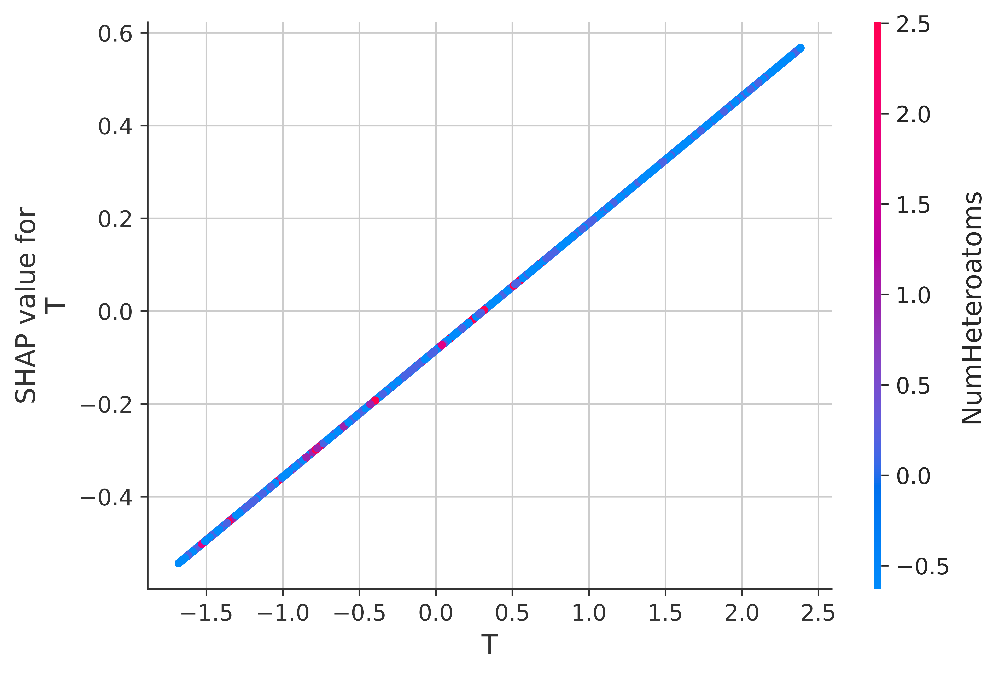

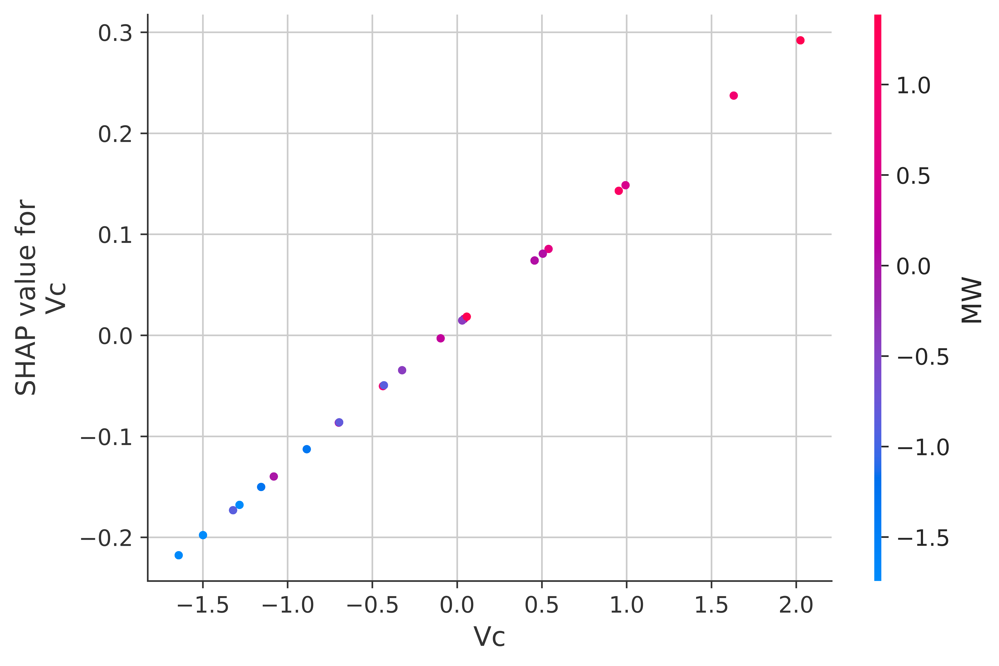

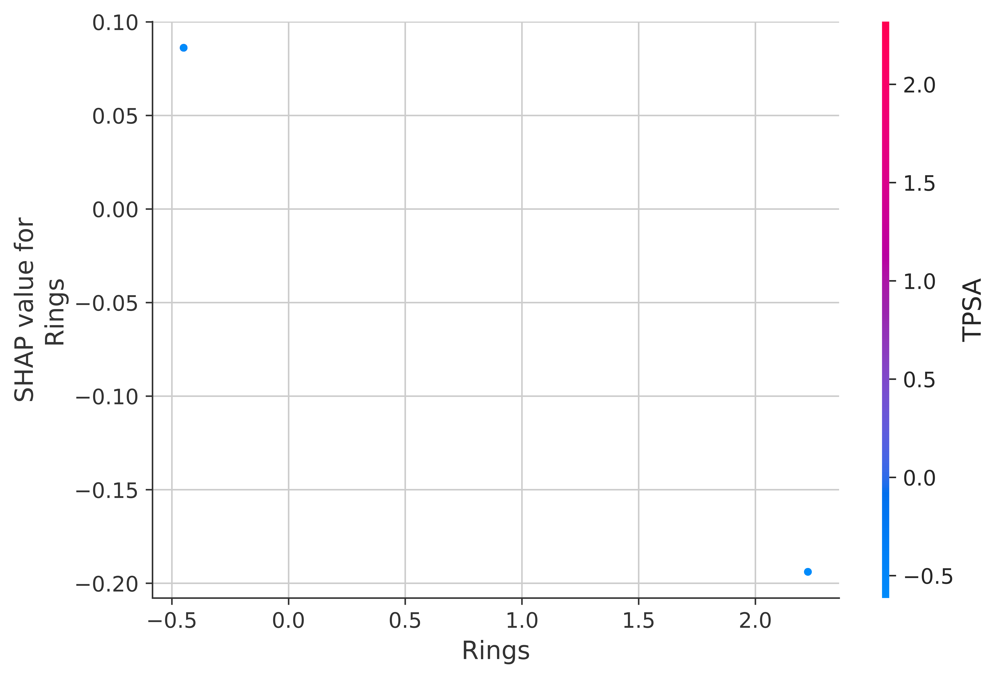

✓ Dependence plots saved as 'shap_dependence_top3.png'


In [ ]:
top_3_idx = np.argsort(mean_abs_shap.flatten())[::-1][:3]
top_3_features = [feature_cols[i] for i in top_3_idx]
print(f"Top 3 most important features: {top_3_features}")
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
shap_values_2d = shap_values_array.reshape(shap_values_array.shape[0], -1)
for i, (idx, feature_name) in enumerate(zip(top_3_idx, top_3_features)):
    plt.sca(axes[i])
    shap.dependence_plot(
        idx,
        shap_values_2d,
        X_test,
        feature_names=feature_cols,
        show=False
    )
    axes[i].set_title(f"Dependence: {feature_name}", fontsize=12, fontweight='bold')
plt.tight_layout()
plt.savefig('shap_dependence_top3.png', dpi=300, bbox_inches='tight')
plt.show()
print("✓ Dependence plots saved as 'shap_dependence_top3.png'")

In [ ]:
# Create dependence plots for ALL features
n_features = len(feature_cols)
n_cols = 4
n_rows = (n_features + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, n_rows * 4))
axes = axes.flatten()

# Reshape shap_values_array to be 2D (n_samples, n_features)
shap_values_2d = shap_values_array.reshape(shap_values_array.shape[0], -1)

for idx, feature_name in enumerate(feature_cols):
    plt.sca(axes[idx])
    shap.dependence_plot(
        idx,
        shap_values_2d, # Use the reshaped shap_values_2d
        X_test,
        feature_names=feature_cols,
        show=False,
        ax=axes[idx]
    )
    axes[idx].set_title(f"{feature_name}", fontsize=10, fontweight='bold')

# Hide extra subplots
for idx in range(n_features, len(axes)):
    axes[idx].axis('off')

plt.tight_layout()
plt.savefig('shap_dependence_all_features.png', dpi=300, bbox_inches='tight')
plt.show()

print("✓ All dependence plots saved as 'shap_dependence_all_features.png'")

✓ All dependence plots saved as 'shap_dependence_all_features.png'


In [ ]:
from tqdm.notebook import tqdm
print("Calculating SHAP interaction values...")
print("This may take 5-10 minutes...")
X_interaction = X_scaled[:50000]
batch_size_interaction = 200
n_samples_interaction = X_interaction.shape[0]
all_shap_interaction_values = []
for i in tqdm(range(0, n_samples_interaction, batch_size_interaction), desc="Calculating SHAP interaction values for batches"):
    batch_X_interaction = X_interaction[i:i + batch_size_interaction]
    batch_shap_interaction_values = explainer.shap_values(batch_X_interaction, check_additivity=False)
    if isinstance(batch_shap_interaction_values, list):
        all_shap_interaction_values.append(batch_shap_interaction_values[0]) # For regression, take the first element
    else:
        all_shap_interaction_values.append(batch_shap_interaction_values)
shap_interaction_values = np.vstack(all_shap_interaction_values)
print("✓ SHAP interaction values calculated!")
print(f"Shape: {np.array(shap_interaction_values).shape}")

Calculating SHAP interaction values...
This may take 5-10 minutes...


Calculating SHAP interaction values for batches:   0%|          | 0/250 [00:00<?, ?it/s]

✓ SHAP interaction values calculated!
Shape: (50000, 17, 1)


<Figure size 8000x6000 with 0 Axes>

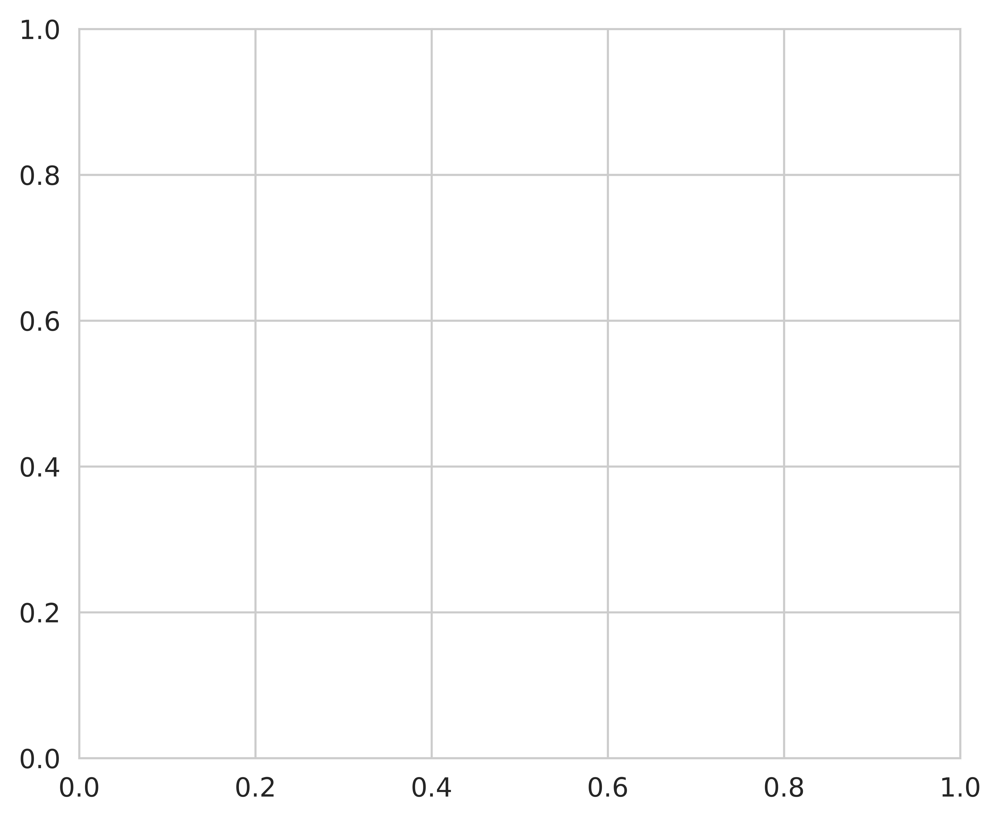

<Figure size 8000x6000 with 0 Axes>

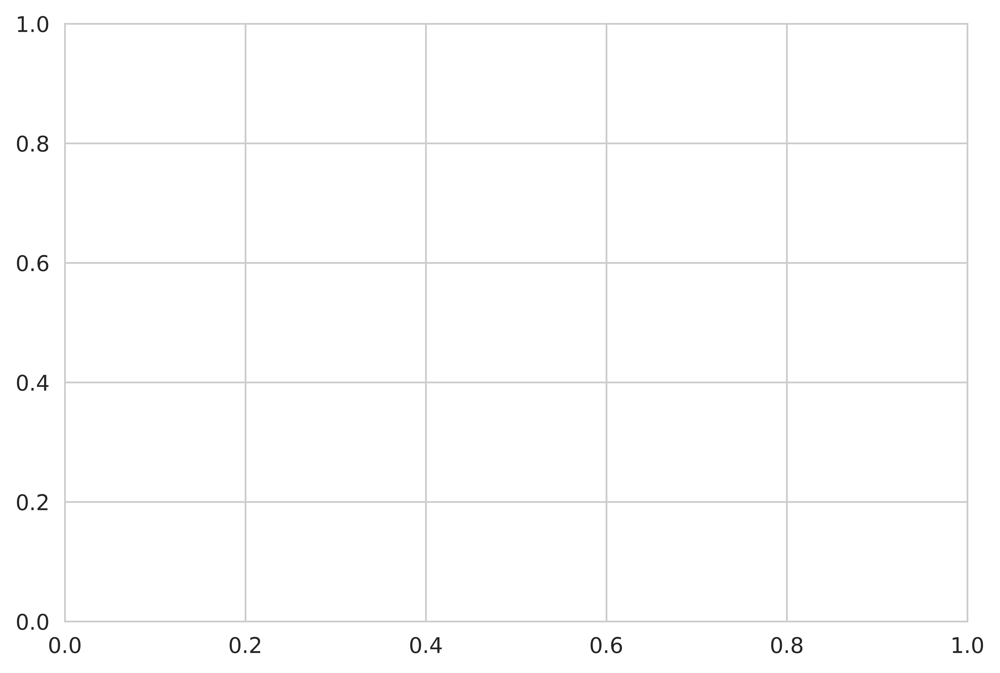

<Figure size 8000x6000 with 0 Axes>

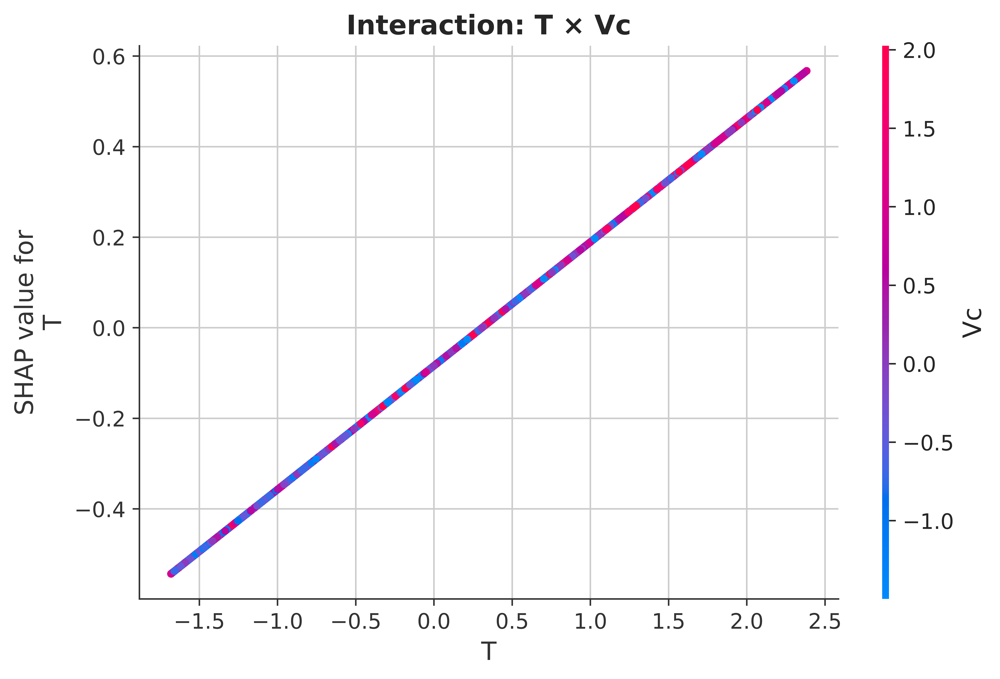

✓ Interaction plot saved as 'shap_interaction_top2.png'


In [ ]:
if isinstance(shap_interaction_values, list):
    interaction_values = shap_interaction_values[0]
else:
    interaction_values = shap_interaction_values
interaction_values_2d = interaction_values.reshape(interaction_values.shape[0], -1)
top_2_idx = np.argsort(mean_abs_shap.flatten())[::-1][:2]
plt.figure(figsize=(8, 6))
shap.dependence_plot(
    top_2_idx[0],
    interaction_values_2d,
    X_interaction,
    feature_names=feature_cols,
    interaction_index=top_2_idx[1],
    show=False
)
plt.title(f"Interaction: {feature_cols[top_2_idx[0]]} × {feature_cols[top_2_idx[1]]}",
          fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('shap_interaction_top2.png', dpi=300, bbox_inches='tight')
plt.show()

print("✓ Interaction plot saved as 'shap_interaction_top2.png'")

In [ ]:
# Comprehensive sensitivity summary
print("="*80)
print("PARAMETER SENSITIVITY ANALYSIS SUMMARY")
print("="*80)

print("\n1. TOP 5 MOST SENSITIVE PARAMETERS:")
print("-" * 80)
for idx, row in feature_importance_df.head(5).iterrows():
    print(f"   {row['Importance_Rank']}. {row['Feature']:<20} "
          f"Mean |SHAP|: {row['Mean_Abs_SHAP']:.6f}")

print("\n2. BOTTOM 5 LEAST SENSITIVE PARAMETERS:")
print("-" * 80)
for idx, row in feature_importance_df.tail(5).iterrows():
    print(f"   {row['Importance_Rank']}. {row['Feature']:<20} "
          f"Mean |SHAP|: {row['Mean_Abs_SHAP']:.6f}")

print("\n3. SENSITIVITY DISTRIBUTION:")
print("-" * 80)
total_importance = feature_importance_df['Mean_Abs_SHAP'].sum()
feature_importance_df['Percentage'] = (feature_importance_df['Mean_Abs_SHAP'] /
                                        total_importance * 100)

cumulative_pct = 0
for idx, row in feature_importance_df.iterrows():
    cumulative_pct += row['Percentage']
    print(f"   {row['Feature']:<20} {row['Percentage']:>6.2f}% "
          f"(Cumulative: {cumulative_pct:>6.2f}%)")

print("\n4. KEY INSIGHTS:")
print("-" * 80)
top_5_pct = feature_importance_df.head(5)['Percentage'].sum()
print(f"   • Top 5 features account for {top_5_pct:.2f}% of total importance")

top_10_pct = feature_importance_df.head(10)['Percentage'].sum()
print(f"   • Top 10 features account for {top_10_pct:.2f}% of total importance")

print("="*80)


PARAMETER SENSITIVITY ANALYSIS SUMMARY

1. TOP 5 MOST SENSITIVE PARAMETERS:
--------------------------------------------------------------------------------
   1. T                    Mean |SHAP|: 0.241671
   2. Vc                   Mean |SHAP|: 0.115007
   3. Rings                Mean |SHAP|: 0.104047
   4. Refractivity         Mean |SHAP|: 0.090872
   5. HBA                  Mean |SHAP|: 0.061073

2. BOTTOM 5 LEAST SENSITIVE PARAMETERS:
--------------------------------------------------------------------------------
   13. Pc                   Mean |SHAP|: 0.024121
   14. LogP                 Mean |SHAP|: 0.024029
   15. TPSA                 Mean |SHAP|: 0.017709
   16. HBD                  Mean |SHAP|: 0.017516
   17. P                    Mean |SHAP|: 0.015281

3. SENSITIVITY DISTRIBUTION:
--------------------------------------------------------------------------------
   T                     22.86% (Cumulative:  22.86%)
   Vc                    10.88% (Cumulative:  33.74%)
   Ring